### unzipping file

In [ ]:
#!unzip "/content/drive/MyDrive/Dog breed/dog_breed_data/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog breed/dog_breed_data"

## importings

In [1]:
import pandas as pd
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub
import keras
import sys


In [2]:
tf.__version__ # version 2.15.0 works for kaggles models

'2.17.1'

In [ ]:
sys.version

'3.10.12 (main, Nov  6 2024, 20:22:13) [GCC 11.4.0]'

In [4]:
%pip install tensorflow==2.12.0

INFO: pip is looking at multiple versions of jax to determine which version is compatible with other requirements. This could take a while.
INFO: pip is still looking at multiple versions of jax to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 586.0/586.0 MB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 53.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 44.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 23.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 36.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 440.7/440.7 kB 36.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.4/78.4 kB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.6/79.6 MB 10.1 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.17.2
    Uninst

In [10]:
print(f"GPU","T4" if tf.config.list_physical_devices else "not")

GPU T4


## starting *project*

In [ ]:
labels_csv= pd.read_csv("/content/drive/MyDrive/Dog_breed/dog_breed_data/labels.csv")
print(labels_csv.describe())
print(labels_csv["breed"].value_counts().mean())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
85.18333333333334


<Axes: xlabel='breed'>

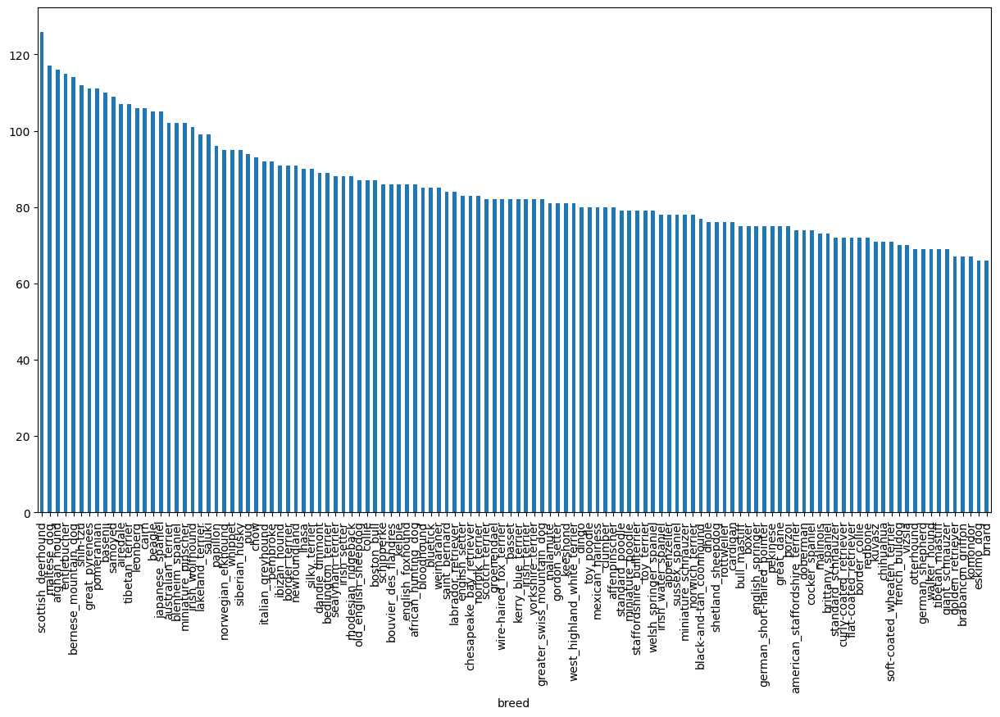

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(15,8))

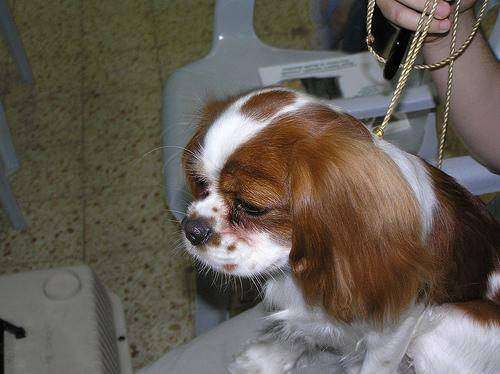

In [ ]:
from IPython.display import Image
Image("/content/drive/MyDrive/Dog_breed/dog_breed_data/train/d9195974648b224678fb0ef0b86007d7.jpg")

In [ ]:
filenames = ["/content/drive/MyDrive/Dog_breed/dog_breed_data/train/"+fnames +".jpg"for fnames in labels_csv['id']]

# counting pictures in folder and file path in csv to be sure they are equal

In [ ]:
import os
len(os.listdir("/content/drive/MyDrive/Dog_breed/dog_breed_data/test/"))

10357

In [ ]:
# another way
dir_path ="/content/drive/MyDrive/Dog_breed/dog_breed_data/train"
count = 0
# Iterate directory
for path in os.listdir(dir_path):
    # check if current path is a file
    if os.path.isfile(os.path.join(dir_path, path)):
        count += 1
print('File count:', count)

File count: 10258


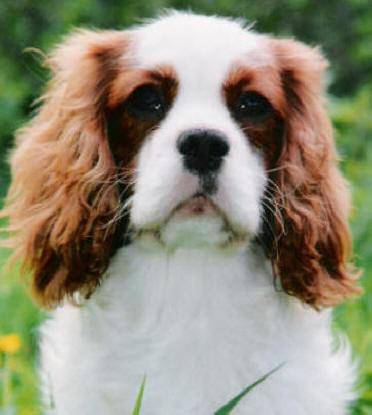

In [ ]:
Image(filenames[1334])

In [ ]:
labels_csv.breed[1334]

'blenheim_spaniel'

In [ ]:
breedlist= labels_csv["breed"].to_numpy()
type(breedlist)

numpy.ndarray

In [ ]:
breedlist

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
uniquebreed = np.unique(breedlist)

In [ ]:
labels_csv.breed[0] == uniquebreed

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
boolean_labels = [labels==np.array(uniquebreed) for labels in breedlist]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
print(labels_csv.breed[0])
print(np.where(labels_csv.breed[0]==uniquebreed ))
print(boolean_labels[0].argmax())

boston_bull
(array([19]),)
19


## spliting data

In [ ]:
x = filenames
y = boolean_labels

In [ ]:
type(x) , type(y)

(list, list)

In [ ]:
NUM_IMAGES = 1000 #@param {type:"slider" , max:10000 , min:1000 ,step:100}

In [ ]:
from sklearn.model_selection import train_test_split
x_train,x_val,y_train,y_val = train_test_split(x[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2,random_state=21)
len(x_train),len(y_train),len(x_val),len(y_val)

(800, 800, 200, 200)

In [ ]:
from matplotlib.pyplot import imread

In [ ]:
image = imread(filenames[0])
# image.max() # color bit mixture of rgb
image.shape

(375, 500, 3)

In [ ]:
tf.constant(image)


<tf.Tensor: shape=(375, 500, 3), dtype=uint8, numpy=
array([[[108,  46,   0],
        [152,  92,  42],
        [180, 120,  70],
        ...,
        [176, 144,  69],
        [189, 157,  82],
        [214, 182, 107]],

       [[151,  93,  47],
        [179, 121,  75],
        [167, 111,  64],
        ...,
        [167, 136,  56],
        [172, 139,  60],
        [188, 157,  77]],

       [[151,  98,  56],
        [188, 137,  94],
        [162, 113,  70],
        ...,
        [200, 168,  81],
        [196, 162,  75],
        [200, 168,  81]],

       ...,

       [[189, 122,  69],
        [186, 119,  66],
        [183, 116,  63],
        ...,
        [213, 160, 106],
        [212, 159, 107],
        [209, 156, 102]],

       [[186, 119,  66],
        [184, 117,  64],
        [183, 116,  63],
        ...,
        [197, 145,  88],
        [199, 146,  92],
        [199, 147,  90]],

       [[182, 115,  62],
        [181, 114,  61],
        [183, 116,  63],
        ...,
        [184, 132,  7

## create fun() to get image filepath and return tensors

In [ ]:
IMAGE_SIZE = 224 #@param {type:"slider",max:255,min:100}

In [ ]:
def process_image(filepath,imagesize = IMAGE_SIZE):
  image = tf.io.read_file(filepath)
  image = tf.image.decode_jpeg(image,channels=3)
  image = tf.image.convert_image_dtype(image,tf.float32)
  image = tf.image.resize(image,size=[IMAGE_SIZE,IMAGE_SIZE])
  return image

In [ ]:
def get_image_labels(filepath,label):
  """
  make (image,label) as tensor
  """
  image = process_image(filepath)
  return image,label

In [ ]:
NUM_BATCH_SIZE = 32 #@param {type:"slider",max:64,min:16}

## creating fun() for making batches

In [ ]:
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batchess(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data if a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_labels).batch(BATCH_SIZE)
    return data_batch

  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                              tf.constant(y))) # labels

    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_labels)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
train_data = create_data_batchess(x_train,y_train)
val_data = create_data_batchess(x=x_val,y=y_val,valid_data=True)


Creating training data batches...
Creating validation data batches...


In [ ]:
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

# visualizing batches

In [ ]:
train_images,train_breeds = next(train_data.as_numpy_iterator())
val_images,val_breeds = next(val_data.as_numpy_iterator())

In [ ]:
len(train_images)

32

In [ ]:
val_breeds[1]
# yes got out of tensors batch

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False,  True, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
import matplotlib.pyplot as plt
def visualazing25images (image,breed):
  plt.figure(figsize=(10,10))
  for i in range(25):
    plt.subplot(5,5,i+1)
    plt.imshow(image[i])
    plt.title(uniquebreed[breed[i].argmax()])
    plt.axis("off")

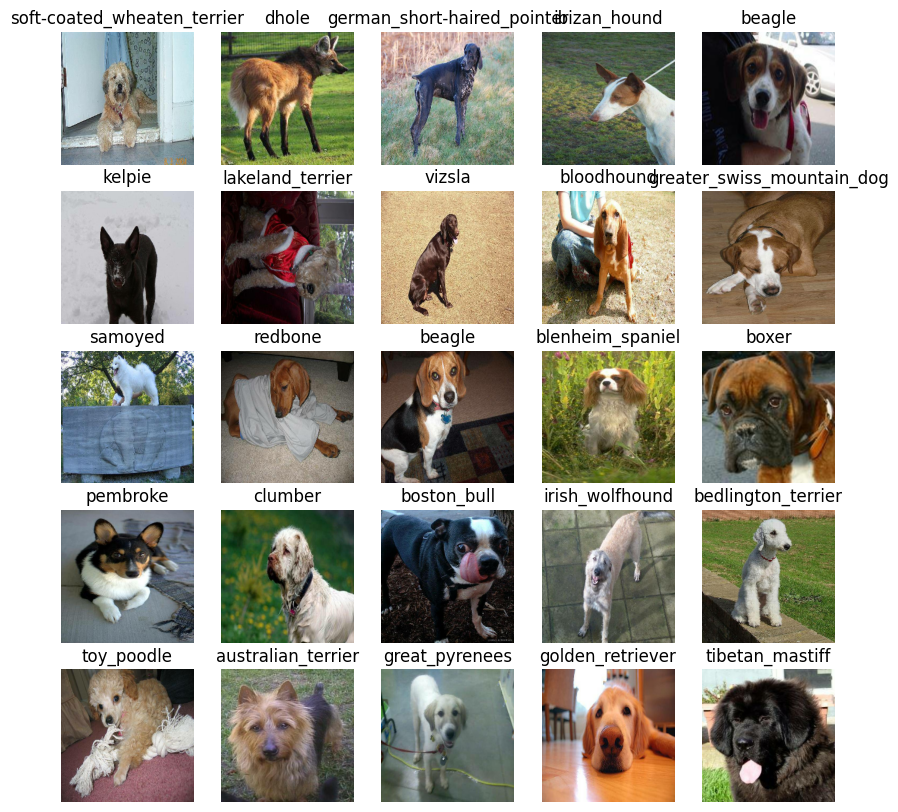

In [ ]:
visualazing25images(train_images,train_breeds)

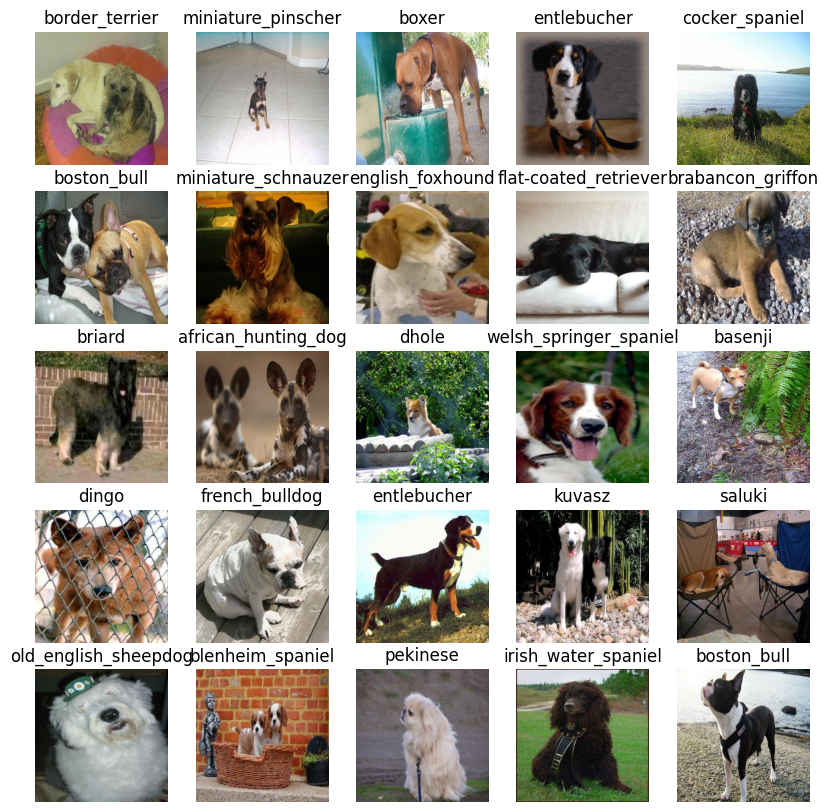

In [ ]:
visualazing25images(val_images,val_breeds)

## start modeling by tensorflow2 mobilenet v4 224

In [ ]:
INPUT = [ None,224 , 224 , 3]
OUTPUT = len(uniquebreed) # 120
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/140-224-classification/2"

In [ ]:
import tensorflow_hub as hub
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, Activation

def create_model (input=INPUT,modelurl=MODEL_URL,output=OUTPUT):
  model = Sequential()
  model.add(hub.KerasLayer(modelurl,
  trainable = False))
  model.add(Dense(units=OUTPUT))
  model.add(Activation('softmax'))

  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
    )
  model.build(input)
  return model

In [ ]:
model1 = create_model()

Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


In [ ]:
model1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              6158505   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
 activation (Activation)     (None, 120)               0         
                                                                 
Total params: 6,278,745
Trainable params: 120,240
Non-trainable params: 6,158,505
_________________________________________________________________


In [ ]:
%load_ext tensorboard
import datetime

In [ ]:
def create_tensorboard_callback():
  logdir = os.path.join("/content/drive/MyDrive/Dog_breed/logs", datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
# create callback to stop overfitting
early_stop = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",patience = 3)

## Training model

In [ ]:
print("GPU"if tf.config.list_physical_devices else "noo")

GPU


In [4]:
NUM_EPOCHS = 100 #@param {type:"slider",min:100,max:1000,step:10}
def train_model():
  model = create_model()
  tensorboard = create_tensorboard_callback()
  model.fit(x=train_data,
            validation_data=val_data,
            validation_freq=1,
            epochs=NUM_EPOCHS,
            callbacks=[tensorboard,early_stop]
            )
  return model

In [ ]:
# model1 = train_model()

## visualizing


In [ ]:
%tensorboard --logdir drive/MyDrive/Dog_breed/logs

<IPython.core.display.Javascript object>

In [ ]:
def load_model(model_path):
  print (f"loading : {model_path}")
  model = tf.keras.models.load_model(model_path,custom_objects ={ "KerasLayer":hub.KerasLayer})
  return model

In [ ]:
loaded1 = load_model("/content/drive/MyDrive/Dog_breed/models/2024-12-31 18:18:55-1000_images_mobilenetv2_Adam.h5")

loading : /content/drive/MyDrive/Dog_breed/models/2024-12-31 18:18:55-1000_images_mobilenetv2_Adam.h5


In [ ]:
predictions = loaded1.predict(val_data,verbose=1)
predictions

2/7 [=======>......................] - ETA: 46s

KeyboardInterrupt: 

In [ ]:
def unbatch_data(predictions,validationdata,index):
  images_=[]
  breeds_=[]
  for image,breed in validationdata.unbatch().as_numpy_iterator():
    images_.append(image)
    breeds_.append(breed)
  return images_ , breeds_

In [ ]:
predictions[0][predictions[0].argsort()[-10:][::-1]] # read top 10 because we force it reading indexes viceversa that are not defind so it resd it by sorting if we used +10 it reads 120-10 indexes

In [ ]:
def bar_chart (prediction,valdata,n):
  unbatch_image , unbatch_breed = unbatch_data(prediction,valdata,n)
  bar_top_values = prediction[n][prediction[n].argsort()[-10:][::-1]]
  bar_top_breedsname = uniquebreed[prediction[n].argsort()[-10:][::-1]]
  pltbar = plt.bar(bar_top_breedsname,bar_top_values,color="grey")
  plt.xticks(bar_top_breedsname,labels=bar_top_breedsname, rotation="vertical")


  if np.isin(uniquebreed[np.argmax(unbatch_breed[n])],bar_top_breedsname):
    pltbar[np.argmax(uniquebreed[np.argmax(unbatch_breed[n])]==bar_top_breedsname)].set_color("green")


In [ ]:
bar_chart(predictions,val_data,0)

In [ ]:
def image_pred(prediction,valdata,i):
  prtitle = uniquebreed[np.argmax(predictions[i])]
  rimage , rtitles= unbatch_data(prediction,valdata,i)

  plt.imshow(rimage[i])
  if np.argmax(rtitles[i])==np.argmax(predictions[i]):
       color = "g"
  else :
      color = "r"

  plt.title(f"pre= {uniquebreed[np.argmax(predictions[i])]}  chance= {round(np.max(predictions[i]*100))}%  real= {uniquebreed[np.argmax(rtitles[i])]}",color=color, fontsize=30)
  plt.axis("off")


In [ ]:
image_pred(predictions,val_data,0)

## final visualizing

In [ ]:
from PIL import Image

i_multiplier =6
n_cols = 4
n_rows = 2
num_images = n_cols*n_rows

fig = plt.figure(figsize=(10*n_cols,8*n_rows))
fig.suptitle("Comparison", fontsize = 30)
plt.subplots_adjust(hspace=0.5)

for i in np.arange(n_rows):
    # 1 subplot

  plt.subplot(n_rows,n_cols,4*i+1)
  bar_chart(predictions,val_data,i+i_multiplier)
    # 2 subplot

  plt.subplot(n_rows,n_cols,4*i+2)
  image_pred(predictions,val_data,i+i_multiplier)
  # getting images from filenames by checking breed name in labels_csv

  top2_breeds_name = uniquebreed[np.argsort(predictions[i+i_multiplier])[-2:][::-1]]
  if (np.isin(top2_breeds_name.all(),labels_csv)):
    # 3 subplot

    plt.subplot(n_rows,n_cols,4*i+3)
    plt.title(f"NO_1 : {top2_breeds_name[0]}",fontsize=20)
    plt.axis("off")
    position1 = labels_csv[top2_breeds_name[0] == labels_csv["breed"]].index[0]
    plt.imshow(Image.open(filenames[position1]))
    # 4 subplot

    plt.subplot(n_rows,n_cols,4*i+4)
    plt.title(f"NO_2 : {top2_breeds_name[1]}",fontsize=20)
    plt.axis("off")
    position2 = labels_csv[top2_breeds_name[1] == labels_csv["breed"]].index[0]
    plt.imshow(Image.open(filenames[position2]))
  else :
    print(f"there is no dog names {top2_breeds_name[0]} or {top2_breeds_name[1]}")





## save and load model


In [ ]:
def save_model(model,suffix):
  modeldir = os.path.join("/content/drive/MyDrive/Dog_breed/models",datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S"))
  model_path = modeldir +"-"+suffix+".h5"
  model.save(model_path)
  return model_path

In [8]:
def load_model(model_path):
  print (f"loading : {model_path}")
  model = tf.keras.models.load_model(model_path,custom_objects ={ "KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# loaded1 = load_model("/content/drive/MyDrive/Dog_breed/models/2024-12-31 18:18:55-1000_images_mobilenetv2_Adam.h5")

In [ ]:
loaded1.evaluate(val_data)

## Training full data

In [ ]:
full_data = create_data_batchess(x,y)
full_data

Creating training data batches...


<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
full_model = create_model()

In [ ]:
full_model_tensorboar = create_tensorboard_callback()

In [ ]:
full_model_early_stop = tf.keras.callbacks.EarlyStopping(monitor="accuracy",patience=3)

In [9]:
print(f"GPU","T4" if tf.config.list_physical_devices else "not")

GPU T4


In [ ]:
# full_model.fit(x=full_data,
#                epochs=NUM_EPOCHS,
#                callbacks=[full_model_tensorboar,full_model_early_stop])

# takes about 20 min

In [ ]:
# save_model(full_model,suffix="full_model_mobilenetv2_Adam")

## test the Test images

In [ ]:
filenamesTest = ["/content/drive/MyDrive/Dog_breed/dog_breed_data/test/"+i for i in os.listdir("/content/drive/MyDrive/Dog_breed/dog_breed_data/test")]
filenamesTest[:5]


In [ ]:
test_data = create_data_batchess(filenamesTest,test_data=True)

In [ ]:
# test_predicts = full_model.predict(test_data)
# takes about 17 min

In [ ]:
# np.savetxt("/content/drive/MyDrive/Dog_breed/Test_Result/preds_array.csv",test_predicts,delimiter=",")

In [ ]:
loaded_test = np.loadtxt("/content/drive/MyDrive/Dog_breed/Test_Result/preds_array.csv",delimiter=",")

In [ ]:
loaded_test.shape

In [ ]:
# another way to remove str from list
splited = [os.path.splitext(sub)[0] for sub in os.listdir("/content/drive/MyDrive/Dog_breed/dog_breed_data/test")]


In [ ]:
kaggle_csv = pd.DataFrame(columns=["id"]+list(uniquebreed) )
changestr = [delete[53:-4] for delete in filenamesTest]
kaggle_csv["id"]=splited
kaggle_csv[list(uniquebreed)] = loaded_test
kaggle_csv

In [ ]:
# kaggle_csv.to_csv("/content/drive/MyDrive/Dog_breed/Test_Result/TEST_RESULT1.csv",index=False)

## testing my own photos

In [ ]:
myphotos = ["/content/drive/MyDrive/Dog_breed/my_pics/"+fname for fname in os.listdir("/content/drive/MyDrive/Dog_breed/my_pics")]
myphotos
pic1_batch = create_data_batchess(x=myphotos,test_data=True)

Creating test data batches...


In [11]:
loaded_full_model = load_model("/content/drive/MyDrive/Dog_breed/models/2024-12-31 18:18:55-1000_images_mobilenetv2_Adam.h5")

loading : /content/drive/MyDrive/Dog_breed/models/2024-12-31 18:18:55-1000_images_mobilenetv2_Adam.h5


TypeError: CategoricalCrossentropy.__init__() got an unexpected keyword argument 'fn'

In [ ]:
myphotos_preds =  loaded_full_model.predict(pic1_batch)

1/1 [==============================] - 1s 1s/step


In [ ]:
len(myphotos_preds)

5

In [ ]:
name_results = [uniquebreed[np.argmax(myphotos_preds[i])] for i in range(len(myphotos_preds))]

In [ ]:
unbatches = []
for i in pic1_batch.unbatch().as_numpy_iterator():
  unbatches.append(i)

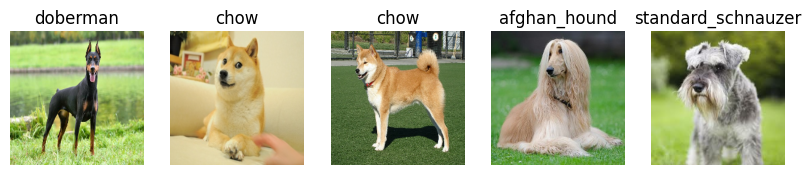

In [ ]:
fig = plt.figure(figsize=(10,10))
for i , image in enumerate(unbatches):
  plt.subplot(1,5,i+1)
  plt.title(name_results[i])
  plt.axis("off")
  plt.imshow(image)

# visualizing our dense layer
* Activation maximization
* Saliency maps
* Class activation maps

In [7]:
import vis
from vis.visualization import visualize_activation
from vis.utils import utils
from keras import activations
from matplotlib import pyplot as plt
%matplotlib inline

plt.rcParams['figure.figsize'] = (18, 6)

# Utility to search for layer index by name.
# Alternatively we can specify this as -1 since it corresponds to the last layer.
layer_idx = utils.find_layer_idx(load_model, 'preds')

# Swap softmax with linear
load_model.layers[layer_idx].activation = activations.linear
load_model = utils.apply_modifications(load_model)

# This is the output node we want to maximize.
filter_idx = 0
img = visualize_activation(load_model, layer_idx, filter_indices=filter_idx)
plt.imshow(img[..., 0])

ImportError: cannot import name 'Iterable' from 'collections' (/usr/lib/python3.11/collections/__init__.py)